<a href="https://colab.research.google.com/github/airctic/icevision/blob/master/notebooks/getting_started_instance_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started with Instance Segmentation using IceVision

## Introduction

This tutorial walk you through the different steps of training the fridge dataset. the IceVision Framework is an **agnostic framework**. As an illustration, we will train our model using both the [fastai](https://github.com/fastai/fastai) library, and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning) libraries.

For more information about how the fridge dataset as well as its corresponding parser check out the [pennfudan folder](https://github.com/airctic/icedata/tree/master/icedata/datasets/pennfudan) in icedata.

## Installing IceVision and IceData
If on Colab run the following cell, else check the [installation instructions](https://airctic.com/dev/install/)

Install from pypi...

In [ ]:
# IceVision - IceData - MMDetection - YOLO v5 Installation
!wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# Choose your installation target: cuda11 or cuda10 or cpu
!bash icevision_install.sh cuda11

... or from icevision master

In [ ]:
# # Torch - Torchvision - IceVision - IceData - MMDetection - YOLOv5 - EfficientDet Installation
# !wget https://raw.githubusercontent.com/airctic/icevision/master/icevision_install.sh

# # Choose your installation target: cuda11 or cuda10 or cpu
# !bash icevision_install.sh cuda11 master

In [ ]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

## Imports

In [1]:
from icevision.all import *

INFO     - The mmdet config folder already exists. No need to downloaded it. Path : /home/dnth/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs | icevision.models.mmdet.download_configs:download_mmdet_configs:17


## Model
To create a model, we need to:

* Choose one of the **models** supported by IceVision
* Choose one of the **backbones** corresponding to a chosen model
* Determine the **number of the object classes**: This will be done after parsing a dataset. Check out the Parsing Section 

## Choose a model and backbone

We use **MMDet** here. When you want to use the torch vision version the COCOMetric will not be correct at the moment due to a problem in the bounding box conversion.

In [17]:
# Just change the value of selection to try another model

selection = 1

if selection == 0:
    model_type = models.mmdet.mask_rcnn
    backbone = model_type.backbones.resnet50_fpn_1x
    
if selection == 1:
    model_type = models.mmdet.mask_rcnn
    backbone = model_type.backbones.mask_rcnn_swin_t_p4_w7_fpn_1x_coco

if selection == 2:
    model_type = models.mmdet.yolact
    backbone = model_type.backbones.r101_1x8_coco

## Datasets : Pennfudan
Fridge Objects dataset is tiny dataset that contains 134 images of 4 classes:
- can, 
- carton, 
- milk bottle, 
- water bottle.

IceVision provides very handy methods such as loading a dataset, parsing annotations, and more. 

In [18]:
# Loading Data
data_dir = icedata.pennfudan.load_data()
parser = icedata.pennfudan.parser(data_dir)

In [19]:
# train_ds, valid_ds = icedata.pennfudan.dataset(data_dir)
train_rs, valid_rs = parser.parse()

  0%|          | 0/170 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/170 [00:00<?, ?it/s]

In [20]:
# Transforms
image_size = 512
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=1024), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [21]:
train_ds = Dataset(train_rs, train_tfms)
valid_ds = Dataset(valid_rs, valid_tfms)

### Displaying the same image with different transforms

Note:
> Transforms are applied **lazily**, meaning they are only applied when we grab (get) an item.
> This means that, if you have augmentation (random) transforms, each time you get the **same** item from 
> the dataset you will get a slightly different version of it.

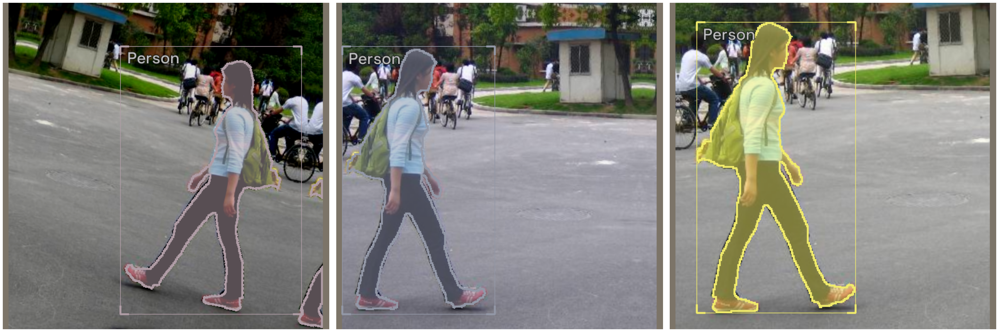

In [22]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

## DataLoader

In [23]:
# DataLoaders
train_dl = model_type.train_dl(train_ds, batch_size=4, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=4, shuffle=False)

In [24]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=8, shuffle=False)

In [25]:
valid_batch = first(valid_dl)
infer_batch = first(infer_dl)

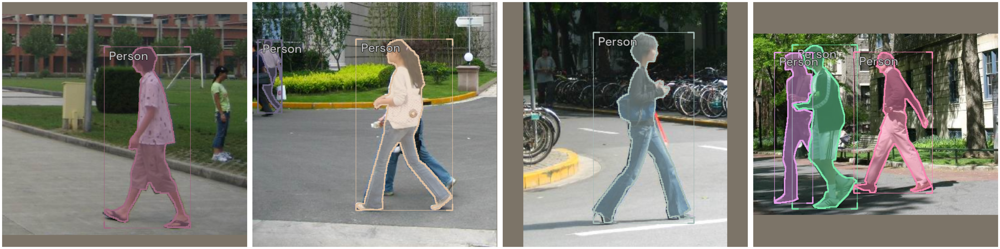

In [26]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

## Model

Now that we determined the number of classes (`num_classes`), we can create our `model` object.

In [ ]:
# TODO: Better flow for train_ds
model = model_type.model(backbone=backbone(pretrained=True), num_classes=icedata.pennfudan.NUM_CLASSES) 

## Metrics

In [28]:
metrics = [COCOMetric(metric_type=COCOMetricType.mask)]

## Training

IceVision is an agnostic framework meaning it can be plugged to other DL framework such as [fastai2](https://github.com/fastai/fastai2), and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning).  

You could also plug to oth DL framework using your own custom code.

### Training using fastai

In [29]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

SuggestedLRs(valley=9.120108734350652e-05)

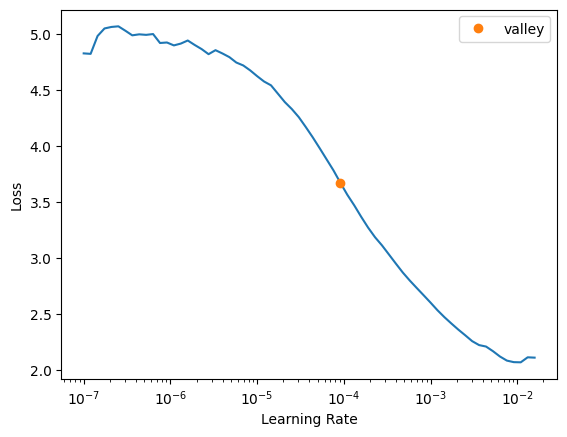

In [30]:
learn.lr_find()

In [31]:
learn.fine_tune(5, 3e-4, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.518704,0.520843,0.610489,00:11
1,0.799316,0.388823,0.689349,00:10


epoch,train_loss,valid_loss,COCOMetric,time
0,0.373752,0.356427,0.690000,00:11
1,0.362768,0.354911,0.721681,00:11
2,0.345709,0.342564,0.722313,00:11
3,0.327585,0.345134,0.733165,00:11
4,0.324897,0.341429,0.732759,00:11


### Training using Lightning

In [32]:
class LightModel(model_type.lightning.ModelAdapter):
    def configure_optimizers(self):
        return Adam(self.parameters(), lr=5e-4)
    
light_model = LightModel(model, metrics=metrics)

In [ ]:
trainer = pl.Trainer(max_epochs=5, gpus=1)
trainer.fit(light_model, train_dl, valid_dl)

## Show Results

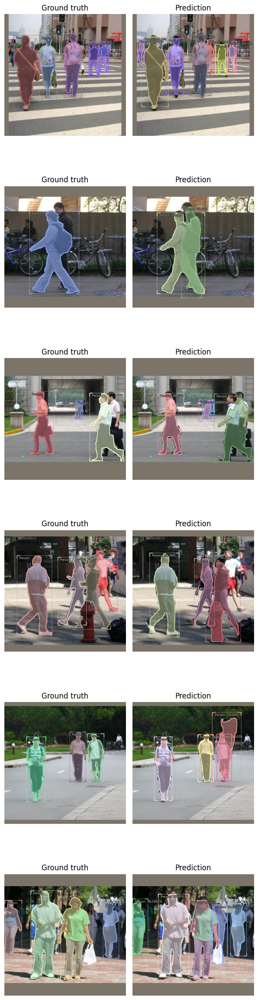

In [34]:
model_type.show_results(model, valid_ds, detection_threshold=.5)

## Inference

### Predicting a batch of images

Instead of predicting a whole list of images at one, we can process small batches at the time: This option is more memory efficient. 


> NOTE: For a more detailed look at inference check out the [inference tutorial](https://airctic.com/dev/inference/)

In [35]:
batch, records = first(valid_dl)

In [36]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/9 [00:00<?, ?it/s]

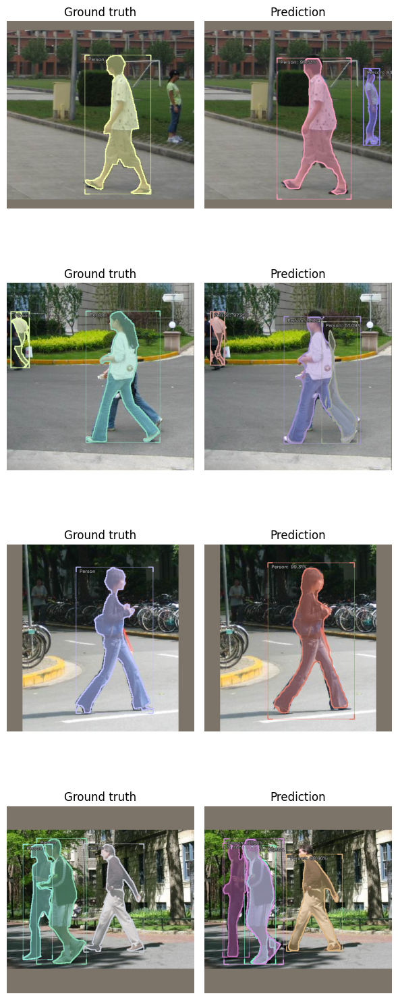

In [37]:
show_preds(preds=preds[:4], ncols=3)

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).